# Visual Search demo

<img src="logo.png" width=350>

## 3. AI generated images

The page demonstrates how to build a visual search system using vector embeddings and Azure AI, enabling users to retrieve and generate images based on text queries and similarity search. Then you can combine images to build new AI generated images.

## Visual search with vector embeddings
Vector embeddings are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

## Business applications
- Digital asset management: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- Medical image retrieval: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- Security and surveillance: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- Forensic image retrieval: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- E-commerce: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- Fashion and design: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

## Images
In this notebook we took some samples fashion images are taken from this link:<br>
https://www.kaggle.com/datasets/paramaggarwal/fashion-product-images-dataset

In [1]:
import datetime
import glob
import os
import shutil
import sys

from azurevisualsearch import download_image, display_images, get_index_status, get_index_stats, visual_search_text, view_search_results, imagen_gptimage1
from azure.storage.blob import BlobServiceClient
from dotenv import load_dotenv
from pathlib import Path
from PIL import Image

In [2]:
print(f"Today is {datetime.datetime.now().strftime('%Y-%m-%d')}")

Today is 2025-07-30


In [3]:
print(f"Python version: {sys.version}")

Python version: 3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]


## 1. Azure AI Services

In [4]:
load_dotenv("azure.env")

# Azure AI Vision
azure_vision_key = os.getenv("azure_vision_key")
azure_vision_endpoint = os.getenv("azure_vision_endpoint")
api_version = "2024-02-01"
model_version = "2023-04-15"

# Azure AI Search
azure_search_key = os.getenv("azure_search_key")
azure_search_endpoint = os.getenv("azure_search_endpoint")
index_name = "fashion-demo-2025"

In [5]:
IMAGES_DIR = "images"
IMAGES_TEST_DIR = "test_images"

In [6]:
COMPOSE_DIR = f"{IMAGES_DIR}/compose_images"

try:
    shutil.rmtree(COMPOSE_DIR)
    print(f"Directory {COMPOSE_DIR} deleted successfully")
except FileNotFoundError:
    print(f"Directory {COMPOSE_DIR} does not exist")
except OSError as e:
    print(f"Error deleting directory: {e}")

print(f"Creating new directory {COMPOSE_DIR}")
os.makedirs(COMPOSE_DIR, exist_ok=True)
print("✅ Done")

Directory images/compose_images does not exist
Creating new directory images/compose_images
✅ Done


In [7]:
IMAGESGEN_DIR= f"{IMAGES_DIR}/ai_genereated_images"

try:
    shutil.rmtree(IMAGESGEN_DIR)
    print(f"Directory {IMAGESGEN_DIR} deleted successfully")
except FileNotFoundError:
    print(f"Directory {IMAGESGEN_DIR} does not exist")
except OSError as e:
    print(f"Error deleting directory: {e}")

print(f"Creating new directory {IMAGESGEN_DIR}")
os.makedirs(IMAGESGEN_DIR, exist_ok=True)
print("✅ Done")

Directory images/ai_genereated_images deleted successfully
Creating new directory images/ai_genereated_images
✅ Done


## 2. Images

In [8]:
blob_connection_string = os.getenv("blob_connection_string")
container_name = os.getenv("container_name")

blob_service_client = BlobServiceClient.from_connection_string(blob_connection_string)
container_client = blob_service_client.get_container_client(container_name)

## 3. Azure AI Search

### Azure AI Search index status

In [9]:
document_count, storage_size = get_index_stats(index_name)

📡 Azure AI Search index status for: fashion-demo-2025

{
  "@odata.context": "https://azureaisearch-sr.search.windows.net/$metadata#Microsoft.Azure.Search.V2024_07_01.IndexStatistics",
  "documentCount": 10226,
  "storageSize": 115928688,
  "vectorIndexSize": 42451784
}


In [10]:
print(f"🔢 Number of documents in the index = {document_count:,}")
print(f"📏 Size of the index = {storage_size / (1024 * 1024):.2f} MB")

🔢 Number of documents in the index = 10,226
📏 Size of the index = 110.56 MB


In [11]:
get_index_status(index_name)

Azure AI Search Index: fashion-demo-2025

{
     "@odata.context": "https://azureaisearch-sr.search.windows.net/$metadata#indexes/$entity",
     "@odata.etag": "\"0x8DDCF67D67B39AB\"",
     "name": "fashion-demo-2025",
     "defaultScoringProfile": null,
     "fields": [
          {
               "name": "idfile",
               "type": "Edm.String",
               "searchable": false,
               "filterable": false,
               "retrievable": true,
               "stored": true,
               "sortable": false,
               "facetable": false,
               "key": true,
               "indexAnalyzer": null,
               "searchAnalyzer": null,
               "analyzer": null,
               "dimensions": null,
               "vectorSearchProfile": null,
               "vectorEncoding": null,
               "synonymMaps": []
          },
          {
               "name": "imagefile",
               "type": "Edm.String",
               "searchable": false,
               

## 4. Visual Search

In [12]:
text = "T-shirt with 'Paris' text on it"

results1 = visual_search_text(index_name, text, topn=3)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0694131021.jpg | 🔗 Cosine Similarity = 0.62126
✅ Top 02: fashion/0691724010.jpg | 🔗 Cosine Similarity = 0.61717
✅ Top 03: fashion/0640258011.jpg | 🔗 Cosine Similarity = 0.61408




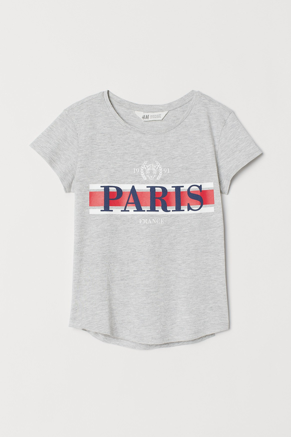
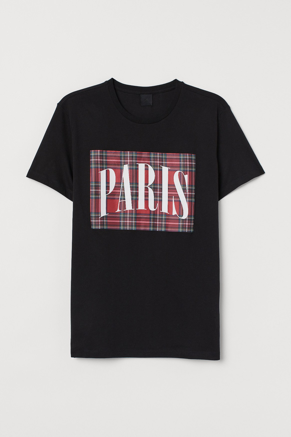
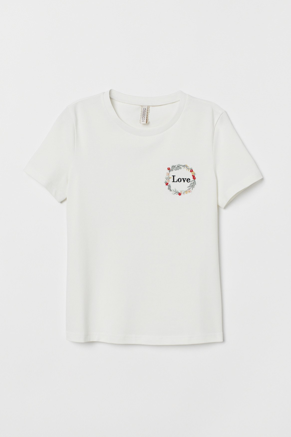

In [13]:
view_search_results(results1)

In [14]:
text = "Some torn blue jeans"

results2 = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0623480002.jpg | 🔗 Cosine Similarity = 0.61562
✅ Top 02: fashion/0626581003.jpg | 🔗 Cosine Similarity = 0.61298
✅ Top 03: fashion/0399136054.jpg | 🔗 Cosine Similarity = 0.61212
✅ Top 04: fashion/0626581002.jpg | 🔗 Cosine Similarity = 0.61089
✅ Top 05: fashion/0627116001.jpg | 🔗 Cosine Similarity = 0.60841
✅ Top 06: fashion/0640021005.jpg | 🔗 Cosine Similarity = 0.60827




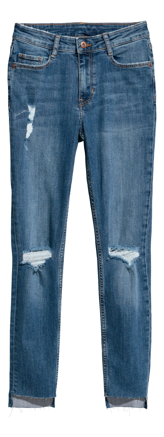
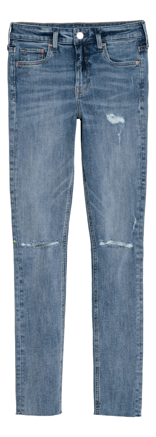
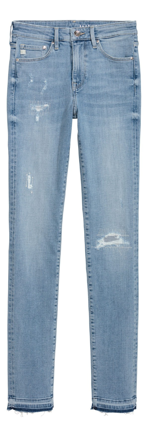
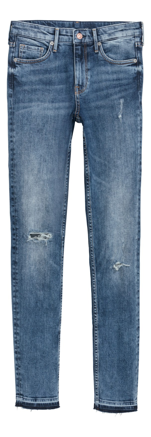
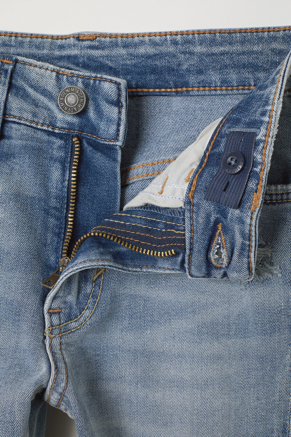
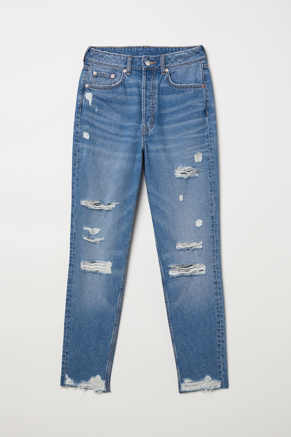

In [15]:
view_search_results(results2)

In [16]:
text = "I want some sneakers with birds on it"

results3 = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0625870004.jpg | 🔗 Cosine Similarity = 0.62172
✅ Top 02: fashion/0620851002.jpg | 🔗 Cosine Similarity = 0.60623
✅ Top 03: fashion/0625642002.jpg | 🔗 Cosine Similarity = 0.60599
✅ Top 04: fashion/0624507002.jpg | 🔗 Cosine Similarity = 0.60392
✅ Top 05: fashion/0698008007.jpg | 🔗 Cosine Similarity = 0.60387
✅ Top 06: fashion/0698715001.jpg | 🔗 Cosine Similarity = 0.60319




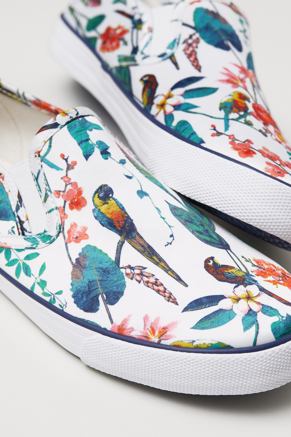
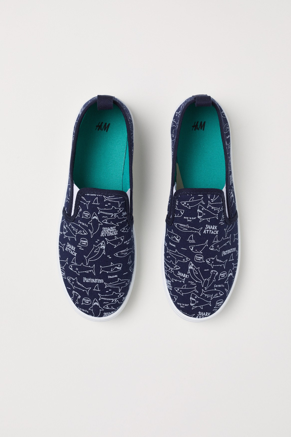
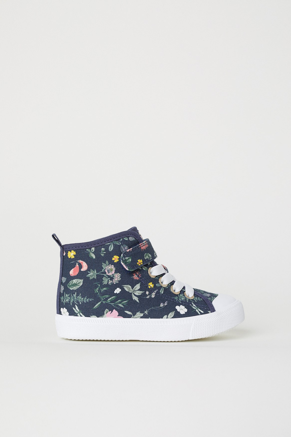
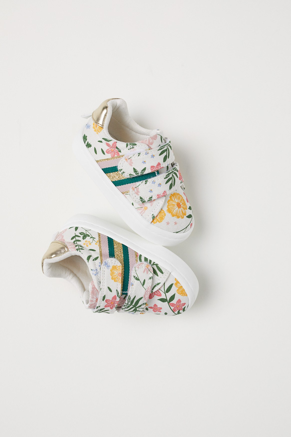
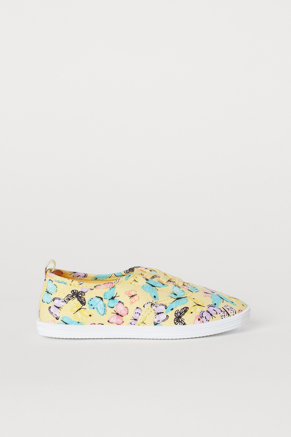
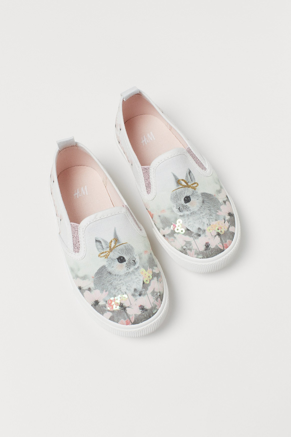

In [17]:
view_search_results(results3)

In [18]:
text = "I want a beautiful hat for a man."

results4 = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0620458001.jpg | 🔗 Cosine Similarity = 0.61486
✅ Top 02: fashion/0641717001.jpg | 🔗 Cosine Similarity = 0.61289
✅ Top 03: fashion/0694751001.jpg | 🔗 Cosine Similarity = 0.61257
✅ Top 04: fashion/0647486001.jpg | 🔗 Cosine Similarity = 0.61221
✅ Top 05: fashion/0694751003.jpg | 🔗 Cosine Similarity = 0.61061
✅ Top 06: fashion/0694662001.jpg | 🔗 Cosine Similarity = 0.61060




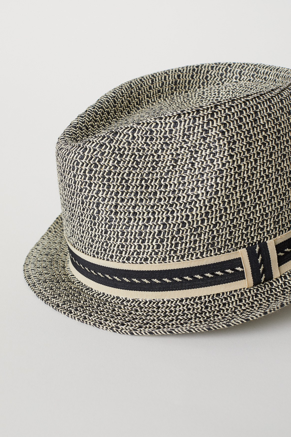
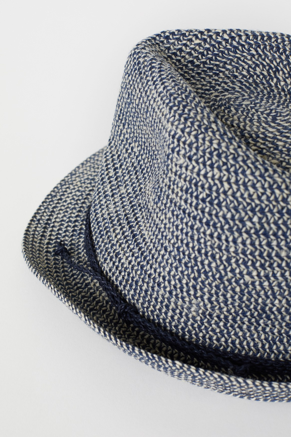
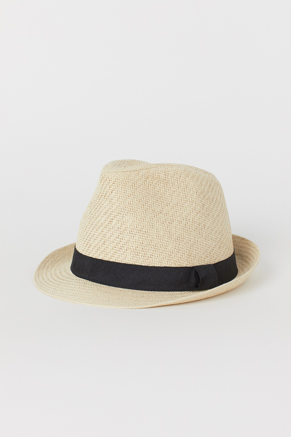
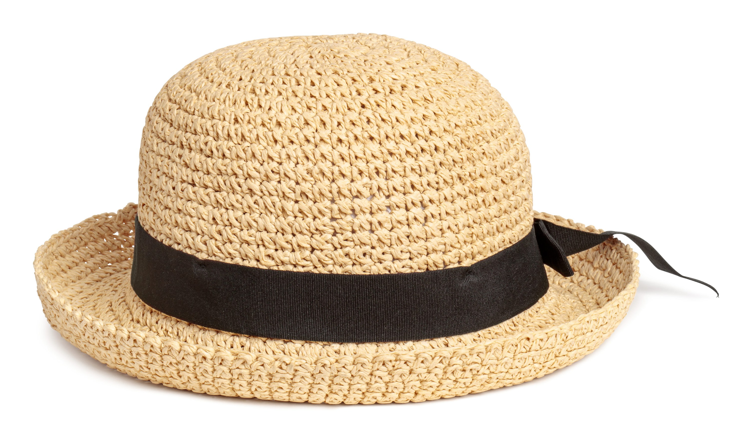
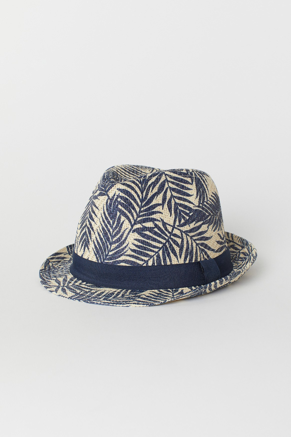
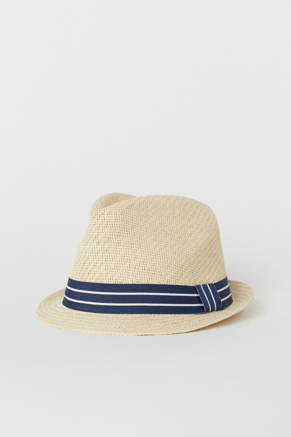

In [19]:
view_search_results(results4)

## 5. Compose

In [20]:
my_products_list = [
    results1[0][0], results2[0][0], results3[0][0], results4[0][0]
]

for product in my_products_list:
    download_image(image_filename=product,
                   output_filename=os.path.join(COMPOSE_DIR, os.path.basename(product))
                  )

✅ Image successfully downloaded from 'fashionimages/fashion/0694131021.jpg' and saved to 'images/compose_images/0694131021.jpg'.
✅ Image successfully downloaded from 'fashionimages/fashion/0623480002.jpg' and saved to 'images/compose_images/0623480002.jpg'.
✅ Image successfully downloaded from 'fashionimages/fashion/0625870004.jpg' and saved to 'images/compose_images/0625870004.jpg'.
✅ Image successfully downloaded from 'fashionimages/fashion/0620458001.jpg' and saved to 'images/compose_images/0620458001.jpg'.


In [21]:
face_image_file = os.path.join(COMPOSE_DIR, "face.jpg")
url_face_image_file = "https://www.thevintagenews.com/wp-content/uploads/2015/11/Portrait-of-President-Abraham-Lincoln-1863.color_.jpg"

!wget $url_face_image_file -O $face_image_file

--2025-07-30 12:55:47--  https://www.thevintagenews.com/wp-content/uploads/2015/11/Portrait-of-President-Abraham-Lincoln-1863.color_.jpg
Resolving www.thevintagenews.com (www.thevintagenews.com)... 2.19.195.187, 2.19.195.210
Connecting to www.thevintagenews.com (www.thevintagenews.com)|2.19.195.187|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.thevintagenews.com/wp-content/uploads/sites/65/2015/11/Portrait-of-President-Abraham-Lincoln-1863.color_.jpg [following]
--2025-07-30 12:55:47--  https://www.thevintagenews.com/wp-content/uploads/sites/65/2015/11/Portrait-of-President-Abraham-Lincoln-1863.color_.jpg
Reusing existing connection to www.thevintagenews.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 23068 (23K) [application/octet-stream]
Saving to: ‘images/compose_images/face.jpg’

images/compose_imag 100%[===================>]  22.53K  --.-KB/s    in 0.002s  

2025-07-30 12:55:48 (12.1 MB/s) - ‘images/compose_i

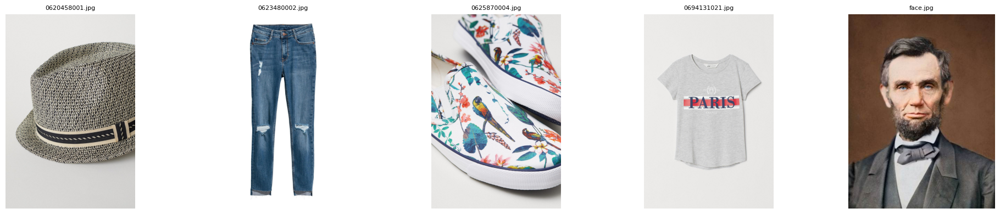

In [22]:
source_images = glob.glob(os.path.join(COMPOSE_DIR, "*.jpg"))
display_images(source_images, images_per_row=5)

✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_125726_396.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_125726_475.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_125726_531.jpg



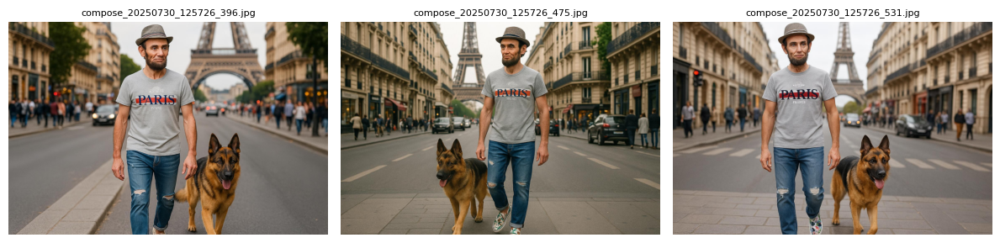

🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model


In [23]:
prompt = """
Create a photorealistic image of a man. 
He is wearing the 4 clothing items shown in the reference images. 
This man is walking along a busy city street, with the Eiffel Tower clearly visible in the background. 
German Shepherd dog is walking closely beside him.
"""

images_list1 = imagen_gptimage1(source_images, prompt, 3, size="1536x1024")

display_images(images_list1, images_per_row=3)
print("🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model")

✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_125918_867.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_125918_923.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_125918_973.jpg



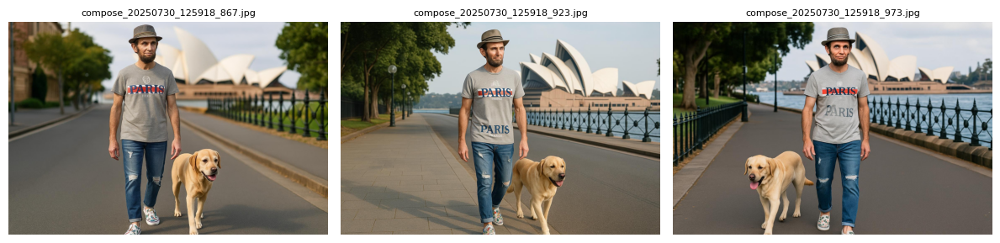

🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model


In [24]:
prompt = """
Create a photorealistic image of a man. 
He is wearing the 4 clothing items shown in the reference images. 
This man is walking along a quiet city street, close to a park, with the Sidney opera house visible in the background. 
A Labrador retriever dog is walking closely beside him.
"""

images_list2 = imagen_gptimage1(source_images, prompt, 3, size="1536x1024")

display_images(images_list2, images_per_row=3)
print("🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model")

✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130100_613.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130100_681.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130100_735.jpg



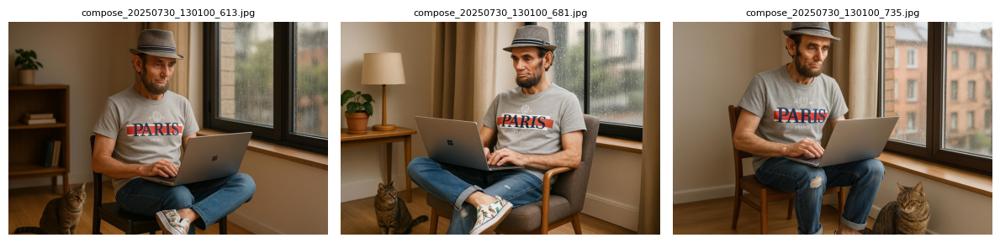

🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model


In [25]:
prompt = """
Create a photorealistic image of a man. 
He is wearing the 4 clothing items shown in the reference images. 
This man is sitting on a chair using a Windows laptop in a cosy apartment. 
A cat is on the ground. We can see the rain outside from the window.
"""

images_list3 = imagen_gptimage1(source_images, prompt, 3, size="1536x1024")

display_images(images_list3, images_per_row=3)
print("🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model")

✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130248_397.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130248_456.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130248_514.jpg



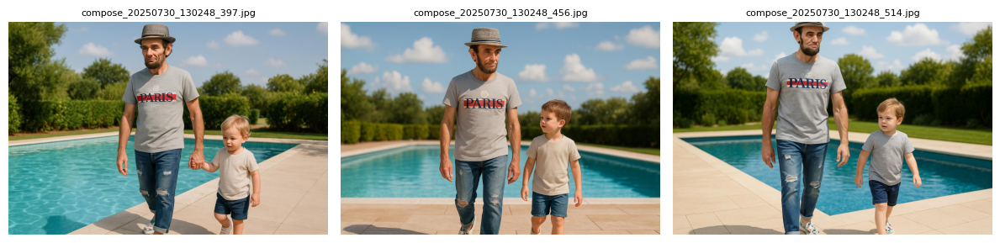

🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model


In [26]:
prompt = """
Create a photorealistic image of a man. 
He is wearing the 4 clothing items shown in the reference images. 
He is walking close to a swimming pool. 
A young child walks closely beside him. 
The sky in the background should appear sunny.
"""

images_list4 = imagen_gptimage1(source_images, prompt, 3, size="1536x1024")

display_images(images_list4, images_per_row=3)
print("🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model")

✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130433_118.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130433_183.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130433_373.jpg



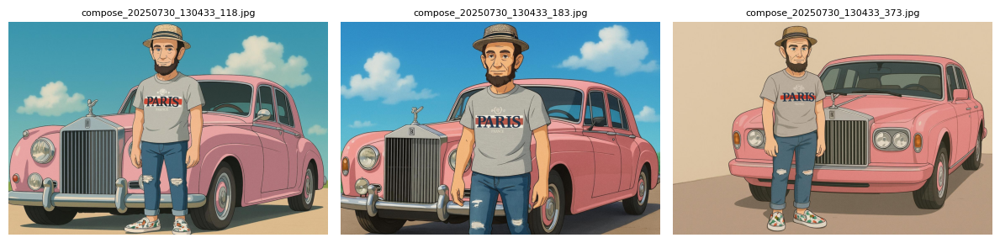

🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model


In [27]:
prompt = """
Create a studio ghibli image of a man.
He is wearing the 4 clothing items shown in the reference images.
The man is close to a pink Rolls-Royce car.
"""

images_list4 = imagen_gptimage1(source_images, prompt, 3, size="1536x1024")

display_images(images_list4, images_per_row=3)
print("🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model")

✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130617_920.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130617_979.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130618_053.jpg



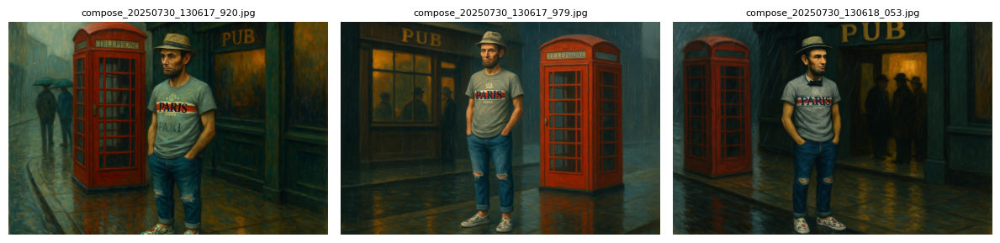

🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model


In [28]:
prompt = """
Create an image in the style of Edward Hopper of a man. 
He is wearing the 4 clothing items shown in the reference images. 
This man is outside a pub during a rainy day. 
He is waiting outside the pub with a couple of friends, close to a red phone booth.
"""

images_list6 = imagen_gptimage1(source_images, prompt, 3, size="1536x1024")

display_images(images_list6, images_per_row=3)
print("🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model")

✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130759_174.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130759_239.jpg
✅ Generated AI image file is saved: images/ai_genereated_images/compose_20250730_130759_285.jpg



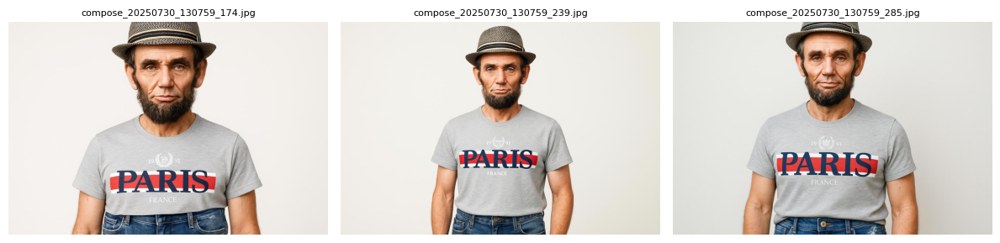

🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model


In [29]:
prompt = """
Create an avatar face of the man. 
He is wearing the 3 clothing items shown in the reference images except the shoes.
"""

images_list7 = imagen_gptimage1(source_images, prompt, 3, size="1536x1024")

display_images(images_list7, images_per_row=3)
print("🧠 These images were generated with Azure AI Foundry and 'gpt-image-1' model")

## 6. In summary

### Real images

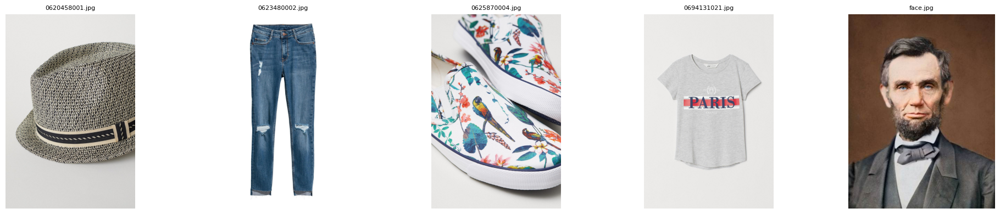

In [30]:
display_images(source_images, 5)

### All generated images

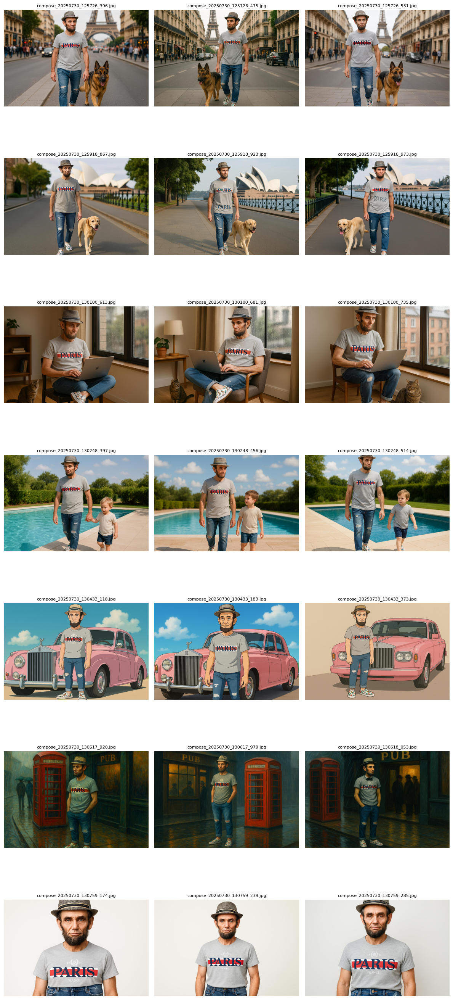

In [31]:
gen_img_list = [f.name for f in Path(IMAGESGEN_DIR).iterdir() if f.suffix.lower() in {'.jpeg', '.png', '.jpg'}]
gen_imgpath_list = [str(Path(IMAGESGEN_DIR) / img) for img in gen_img_list]
gen_imgpath_list.sort()

display_images(gen_imgpath_list, 3)

> Go to the next notebook